# Exploratory Data Analysis: AVIRIS and Duren CH4 Superemitter Estimates

## ER 131 Project | Group 4
**Author: ** ['Marshall Worsham'] <br>
**Date: ** 11-03-2020

In [6]:
#!pip3 install rasterio
#!pip3 install descartes

  Using cached rasterio-1.1.8-1-cp38-cp38-macosx_10_9_x86_64.whl (17.5 MB)
  Using cached affine-2.3.0-py2.py3-none-any.whl (15 kB)
  Using cached snuggs-1.4.7-py3-none-any.whl (5.4 kB)
You should consider upgrading via the '/Users/hmworsham/.pyenv/versions/3.8.2/envs/er131/bin/python3.8 -m pip install --upgrade pip' command.


In [7]:
import pandas as pd   
import zipfile
import geopandas as gpd
import os
import glob
import time
import numpy as np
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import descartes

# rasterio modules
import rasterio
from rasterio.plot import plotting_extent
from rasterio.plot import show
from rasterio.merge import merge
from rasterio.warp import calculate_default_transform, reproject, Resampling

In [8]:
datadir = os.sep.join(['/Volumes', 'Brain', 'GIS', 'ER131', 'Project', 'Data'])

## one flightpath

In [9]:
avirdir = os.sep.join([datadir, 'CH4_Plume_AVIRIS-NG', 'data'])

In [10]:
print('AVIRIS Flight Path 2016:')
filepath = os.sep.join([avirdir, 'ang20170905t172731_cmf_pub_ch4.tif'])
with rasterio.open(filepath) as src:
    print(src.profile)
    extent = plotting_extent(src)

AVIRIS Flight Path 2016:
{'driver': 'GTiff', 'dtype': 'float64', 'nodata': -9999.0, 'width': 686, 'height': 6136, 'count': 1, 'crs': CRS.from_epsg(32611), 'transform': Affine(1.0785528555590005, -0.5260453761468928, 355497.669358,
       -0.5260453761468928, -1.0785528555590005, 3816360.71511), 'tiled': False, 'compress': 'lzw', 'interleave': 'band'}


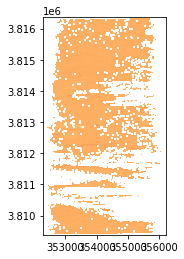

In [18]:
# src = rasterio.open(filepath)
# src_valid = src.read(1, masked = True)
# src_valid[src_valid == 0] = np.nan
# plt.imshow(src_valid, cmap='Spectral', extent = plotting_extent(src));

In [2]:
# plt.hist(src_valid);

## potential emitters data

In [11]:
vistadir = os.sep.join([datadir, 'VISTA', 'NACP_Vista_CA_CH4_Inventory_1726', 'data'])
os.listdir(vistadir)
z = os.listdir(vistadir)

In [35]:
# unzip files from the repository
# on Drive, these are in the source_data/VISTA.zip package
# this should load them, as long as the files remain in the same directory as this notebook

vistadir = os.sep.join([datadir, 'VISTA', 'NACP_Vista_CA_CH4_Inventory_1726/data/'])
os.listdir(vistadir)
zips = [z for z in os.listdir(vistadir) if '.zip' in z]

vista_ch4 = gpd.GeoDataFrame() # initialize empty dataframe
vista_shapefiles = [] # initialize empty list to store shapefile names

# get shapefiles
for z in zips:
    zf = zipfile.ZipFile(os.sep.join([vistadir, z]), 'r')
    fl = zf.extractall()
    vista_shapefiles = [i for i in zf.namelist() if 'shp' in i]
    gpdf = gpd.read_file(vista_shapefiles[0], low_memory = False)
    gpdf = gpdf.rename(columns = {
        'latitude': 'Latitude', 
        'longitude': 'Longitude', 
        'VistaIPCC': 'Vista_IPCC',
        'VistaName': 'Vista_Name',
        'VistaSType': 'Vista_SType',
        'VistaDate': 'Vista_Date',
        'CITY': 'City',
        'STATE': 'State',
        'LATITUDE':'Latitude',
        'LONGITUDE':'Longitude',
        'source': 'Source',
        'SOURCE': 'Source'}
        )
    vista_ch4 = vista_ch4.append(gpdf)

In [68]:
print('There are', vista_ch4.shape[0], 'observations on', vista_ch4.shape[1], 'variables in the geodataframe')
vista_ch4.head()

There are 234576 observations on 12 variables in the geodataframe


,Latitude,Longitude,Vista_IPCC,Vista_Name,Vista_SType,Vista_ID,Vista_Date,State,City,Source,geometry,County
0,37.72799,-120.89865,4B Biological Treatment of Solid Waste,"3D Ag, LLC",Composting Sites,CMP000001,2019-08-20,CA,Oakdale,CalRecycle,"POLYGON ((-120.89865 37.72808, -120.89863 37.7...",NaN
1,33.70999,-117.32864,4B Biological Treatment of Solid Waste,"A. Lua Recycling, Inc.",Composting Sites,CMP000002,2019-08-20,CA,Lake Elsinore,CalRecycle,"POLYGON ((-117.32864 33.71008, -117.32862 33.7...",NaN
2,38.01667,-122.13333,4B Biological Treatment of Solid Waste,Acme Composting Compost Facility,Composting Sites,CMP000003,2019-08-20,CA,Martinez,CalRecycle,"POLYGON ((-122.13333 38.01676, -122.13331 38.0...",NaN
3,34.03281,-118.35424,4B Biological Treatment of Solid Waste,Adams Garden Supply,Composting Sites,CMP000004,2019-08-20,CA,Los Angeles (City),CalRecycle,"POLYGON ((-118.35424 34.03290, -118.35422 34.0...",NaN
4,34.44517,-117.29007,4B Biological Treatment of Solid Waste,Advance Disposal Center for the Environm,Composting Sites,CMP000005,2019-08-20,CA,Hesperia,CalRecycle,"POLYGON ((-117.29007 34.44526, -117.29005 34.4...",NaN


## ca counties

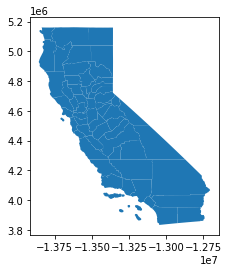

In [69]:
counties = gpd.read_file(os.sep.join([datadir, 'CA_Counties', 'CA_Counties_TIGER2016.shp']))
counties.plot();

In [72]:
# match CRS
print('counties: ', counties.crs)
print('ch4: ', vista_ch4.crs)
counties_wgs84 = counties.to_crs(epsg=4326)
assert counties_wgs84.crs == vista_ch4.crs == 'epsg:4326'
print('matched: ', counties_wgs84.crs, vista_ch4.crs)

counties:  epsg:3857
ch4:  epsg:4326
matched:  epsg:4326 epsg:4326


In [90]:
## sample of points
vista_samp = vista_ch4.groupby('Vista_SType').sample(frac = 0.05, random_state = 42)
print(len(vista_samp))
print(vista_samp.columns)
vista_samp.head() 

11730
Index(['Latitude', 'Longitude', 'Vista_IPCC', 'Vista_Name', 'Vista_SType',
       'Vista_ID', 'Vista_Date', 'State', 'City', 'Source', 'geometry',
       'County'],
      dtype='object')


,Latitude,Longitude,Vista_IPCC,Vista_Name,Vista_SType,Vista_ID,Vista_Date,State,City,Source,geometry,County
422,35.60517,-121.11849,4B Biological Treatment of Solid Waste,Winsor Woodyard,Composting Sites,CMP000423,2019-08-20,CA,Cambria,CalRecycle,"POLYGON ((-121.11849 35.60526, -121.11847 35.6...",NaN
75,37.48700,-120.86900,4B Biological Treatment of Solid Waste,City of Turlock Water Qual. Control Fac,Composting Sites,CMP000076,2019-08-20,CA,Turlock,CalRecycle,"POLYGON ((-120.86900 37.48709, -120.86898 37.4...",NaN
177,36.31535,-120.24435,4B Biological Treatment of Solid Waste,Harris Ranch Feeding Company,Composting Sites,CMP000178,2019-08-20,CA,Coalinga,CalRecycle,"POLYGON ((-120.24435 36.31544, -120.24433 36.3...",NaN
30,34.83617,-117.01773,4B Biological Treatment of Solid Waste,Barstow Sanitary Landfill,Composting Sites,CMP000031,2019-08-20,CA,Barstow,CalRecycle,"POLYGON ((-117.01773 34.83626, -117.01771 34.8...",NaN
361,38.95361,-122.60366,4B Biological Treatment of Solid Waste,South Lake Resource Recovery and Compost,Composting Sites,CMP000362,2019-08-20,CA,Clearlake,CalRecycle,"POLYGON ((-122.60366 38.95370, -122.60364 38.9...",NaN


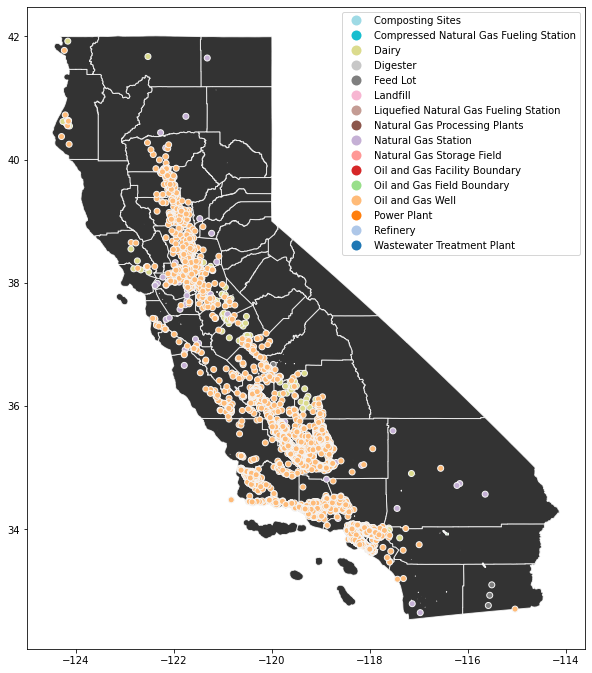

In [91]:
fig, ax = plt.subplots(figsize=(10,20))
counties_wgs84.plot(ax=ax, color = 'black', edgecolor='white', alpha = 0.8)
vista_samp.plot(ax=ax, column = 'Vista_SType', edgecolor = 'whitesmoke', cmap = 'tab20_r', legend = True);

## bunch of flightpaths
I started by trying to mosaic a few flightpaths together but I don't think that's really going to work because of: 

1. computation time
2. the fact of multiple flights over some points

In [3]:
#outpath = os.sep.join([avirdir, '30flightpaths.tif'])
# search_criterion = '*201706*'
# q = os.path.join(locdir, search_criterion)
# ch4_1706 = glob.glob(q)[:3]
# ch4_1706_to_mosaic = []
# for fp in ch4_1706:
#     src = rasterio.open(fp)
#     ch4_1706_to_mosaic.append(src)

In [7]:
# start = time.time()

# mosaic, out_trans = merge(ch4_1706_to_mosaic)

# time.sleep(1)

# end = time.time()

# print(f'Runtime: {end - start} seconds')

Runtime: {end - start} seconds


## merging with Duren et al 2019 'super-emitters' data
after flailing around with trying to extract mean values from the AVIRIS flights I decided to just pull in Duren et al.'s 2019 processed data for CA 'super-emitters', contained in the SI from [this paper](https://www-nature-com.libproxy.berkeley.edu/articles/s41586-019-1720-3.pdf)

### import Duren 2019 data

In [95]:
durendir = os.sep.join([datadir, 'Duren_2019_Nature_Data'])

In [96]:
ch4_source = pd.read_csv(os.sep.join([durendir, 'ch4_major_sources.csv']))
ch4_source = ch4_source.rename(columns = {'source_latitude_degrees':'Latitude', 'source_longitude_degrees': 'Longitude'})
ch4_source.head()

,source_identifier,Latitude,Longitude,source_type,IPCC_sector,n_flights,source_persistence,confidence_in_persistence,Qsource_kg_hr,sQ_kg_hr
0,S00006,34.4471,-118.5883,gas storage facility,1B2 Oil & Natural Gas,66,0.76,1.0,295.4,98.6
1,S00007,33.9060,-118.4063,refinery,1A1 Energy Industries,15,0.13,1.0,22.4,6.2
2,S00008,33.9054,-118.4064,refinery,1A1 Energy Industries,14,0.14,1.0,15.4,5.3
3,S00011,33.7770,-118.2870,refinery,1A1 Energy Industries,11,0.09,1.0,4.9,2.4
4,S00012,33.7726,-118.2864,refinery,1A1 Energy Industries,11,0.27,1.0,21.1,10.4


In [97]:
ch4_source_gpdf = gpd.GeoDataFrame(ch4_source, geometry=gpd.points_from_xy(ch4_source.Longitude, ch4_source.Latitude))
ch4_source_gpdf.shape

(564, 11)

### adjust vista lat/long to match bit length of Duren source

In [98]:
vista_ca_round = vista_ch4
vista_ca_round['Latitude'] = round(vista_ch4['Latitude'], 4)
vista_ca_round['Longitude'] = round(vista_ch4['Longitude'], 4)

In [101]:
ch4_merge = ch4_source_gpdf.merge(vista_ch4, how = 'inner', on = ['Latitude'])

In [102]:
ch4_obs = ch4_merge.drop_duplicates(subset = 'source_identifier', keep = 'first')

In [103]:
ch4_source_gpdf.head()

,source_identifier,Latitude,Longitude,source_type,IPCC_sector,n_flights,source_persistence,confidence_in_persistence,Qsource_kg_hr,sQ_kg_hr,geometry
0,S00006,34.4471,-118.5883,gas storage facility,1B2 Oil & Natural Gas,66,0.76,1.0,295.4,98.6,POINT (-118.58830 34.44710)
1,S00007,33.9060,-118.4063,refinery,1A1 Energy Industries,15,0.13,1.0,22.4,6.2,POINT (-118.40630 33.90600)
2,S00008,33.9054,-118.4064,refinery,1A1 Energy Industries,14,0.14,1.0,15.4,5.3,POINT (-118.40640 33.90540)
3,S00011,33.7770,-118.2870,refinery,1A1 Energy Industries,11,0.09,1.0,4.9,2.4,POINT (-118.28700 33.77700)
4,S00012,33.7726,-118.2864,refinery,1A1 Energy Industries,11,0.27,1.0,21.1,10.4,POINT (-118.28640 33.77260)


## plotting TROPOMI against AVIRIS
code for the plot we used in the pitch video

### open Hikari's TROPOMI point estimates

In [109]:
tropdir = os.sep.join([datadir, 'CH4_Points_TROPOMI'])
vista_tropomi_test = gpd.read_file(os.sep.join([tropdir, 'Vista_CA_Dairies.json']))

In [114]:
tropomi = gpd.GeoDataFrame()
tropfiles = os.listdir(tropdir)
for i in tropfiles:
    gpdf = gpd.read_file(os.sep.join([tropdir, i]), low_memory = False)
    gpdf = gpdf.rename(columns = {
        'latitude': 'Latitude', 
        'longitude': 'Longitude', 
        'VistaIPCC': 'Vista_IPCC',
        'VistaName': 'Vista_Name',
        'VistaSType': 'Vista_SType',
        'VistaDate': 'Vista_Date',
        'CITY': 'City',
        'STATE': 'State',
        'LATITUDE':'Latitude',
        'LONGITUDE':'Longitude',
        'source': 'Source',
        'SOURCE': 'Source'}
        )
    tropomi = tropomi.append(gpdf)

In [118]:
tropomi.rename(columns = {
    'min':'TROPOMI_CH4_Min',
    'max':'TROPOMI_CH4_Max',
    'mean':'TROPOMI_CH4_Mean',
    'count':'TROPOMI_CH4_Count',
    'median':'TROPOMI_CH4_MEDIAN'}, 
    inplace = True
    )
print(tropomi.columns)
tropomi.head()

Index(['City', 'Latitude', 'Longitude', 'Source', 'State', 'Vista_Date',
       'Vista_IPCC', 'Vista_Name', 'Vista_SType', 'Vista_ID',
       'TROPOMI_CH4_Min', 'TROPOMI_CH4_Max', 'TROPOMI_CH4_Mean',
       'TROPOMI_CH4_Count', 'TROPOMI_CH4_MEDIAN', 'geometry', 'County'],
      dtype='object')


,City,Latitude,Longitude,Source,State,Vista_Date,Vista_IPCC,Vista_Name,Vista_SType,Vista_ID,TROPOMI_CH4_Min,TROPOMI_CH4_Max,TROPOMI_CH4_Mean,TROPOMI_CH4_Count,TROPOMI_CH4_MEDIAN,geometry,County
0,Oakdale,37.72799,-120.89865,CalRecycle,CA,2019-08-20,4B Biological Treatment of Solid Waste,"3D Ag, LLC",Composting Sites,CMP000001,1866.219667,1869.152088,1867.685878,2,1867.685878,"POLYGON ((-120.90558 37.82784, -120.89172 37.8...",NaN
1,Lake Elsinore,33.70999,-117.32864,CalRecycle,CA,2019-08-20,4B Biological Treatment of Solid Waste,"A. Lua Recycling, Inc.",Composting Sites,CMP000002,1875.187369,1880.163061,1877.675215,2,1877.675215,"POLYGON ((-117.33593 33.80981, -117.32135 33.8...",NaN
2,Martinez,38.01667,-122.13333,CalRecycle,CA,2019-08-20,4B Biological Treatment of Solid Waste,Acme Composting Compost Facility,Composting Sites,CMP000003,1842.263902,1845.817238,1844.040570,2,1844.040570,"POLYGON ((-122.14023 38.11652, -122.12643 38.1...",NaN
3,Los Angeles (City),34.03281,-118.35424,CalRecycle,CA,2019-08-20,4B Biological Treatment of Solid Waste,Adams Garden Supply,Composting Sites,CMP000004,1854.870680,1895.935669,1880.347071,3,1890.234865,"POLYGON ((-118.36150 34.13264, -118.34698 34.1...",NaN
4,Hesperia,34.44517,-117.29007,CalRecycle,CA,2019-08-20,4B Biological Treatment of Solid Waste,Advance Disposal Center for the Environm,Composting Sites,CMP000005,1867.374578,1868.685923,1868.030250,2,1868.030250,"POLYGON ((-117.29730 34.54500, -117.28284 34.5...",NaN


### export VISTA points to .shp and .geojson

In [129]:
outdir = datadir = os.sep.join(['/Volumes', 'Brain', 'GIS', 'ER131', 'Project', 'Output'])
tropomi.to_file(os.sep.join([vistadir, 'CH4_Emitters_All.shp'])
tropomi.to_file(os.sep.join([vistadir, 'CH4_Emitters_All.geojson', driver = 'GeoJSON'])

### merge tropomi with Duren 2019 observed CH4
there's a lot of data loss here

In [122]:
tropomi_merge = ch4_obs.merge(tropomi, how = 'inner', on = 'Latitude')

### plot

In [125]:
# set x and y
y = tropomi_merge['Qsource_kg_hr']
x = tropomi_merge['TROPOMI_CH4_Mean']

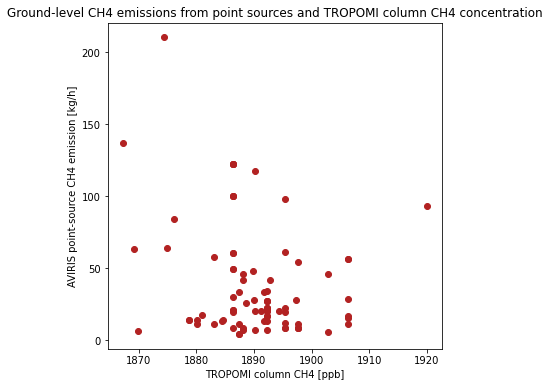

In [126]:
fig = plt.figure(figsize = [6,6])
plt.scatter(x,y, c = 'firebrick')
plt.title('Ground-level CH4 emissions from point sources and TROPOMI column CH4 concentration')
plt.xlabel('TROPOMI column CH4 [ppb]')
plt.ylabel('AVIRIS point-source CH4 emission [kg/h]');

-END-